# Advanced Laneline Detection

## Step 1: camera calibration

In [47]:
# Import modules
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
import time
import collections
from moviepy.editor import VideoFileClip
from IPython.display import HTML
# %matplotlib qt

In [31]:
def retrieveImage(imageList):
    images = []
    for fname in imageList:
        img = cv2.imread(fname)
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        images.append(img)
    return images

def findCorners(images):
    distImages = []
    objpoints = [] # 3d points in real world space
    imgpoints = [] # 2d points in image plane.

    # prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
    objp = np.zeros((6*9,3), np.float32)
    objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

    # Step through the list and search for chessboard corners
    for img in images:
        gray = cv2.cvtColor(img,cv2.COLOR_RGB2GRAY)

        # Find the chessboard corners
        ret, corners = cv2.findChessboardCorners(gray, (9,6), None)

        # If found, add object points, image points
        if ret == True:
            # Draw and display the corners
            img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
            objpoints.append(objp)
            imgpoints.append(corners)
            distImages.append(img)
    return objpoints, imgpoints, distImages

def calibrateCamera(objpoints,imgpoints,distImages):
    imgShape = distImages[0].shape
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, imgShape[0:2], None, None)
    return mtx,dist

def unDistortImage(mtx,dist,img):
    imgUnd = cv2.undistort(img, mtx, dist, None, mtx)
    return imgUnd

def plotCalibratedImages(img, imgUnd, savePath):
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 4))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=16)
    ax2.imshow(imgUnd)
    ax2.set_title('Undistorted Image', fontsize=16)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()
    f.savefig(savePath)
    return f

In [3]:
# Make a list of calibration images
imgList = glob.glob('camera_cal/calibration*.jpg')
imgDist = retrieveImage(imgList)
objPoints, imgPoints, imgDist = findCorners(imgDist)
caliMtx, caliDist = calibrateCamera(objPoints, imgPoints, imgDist)

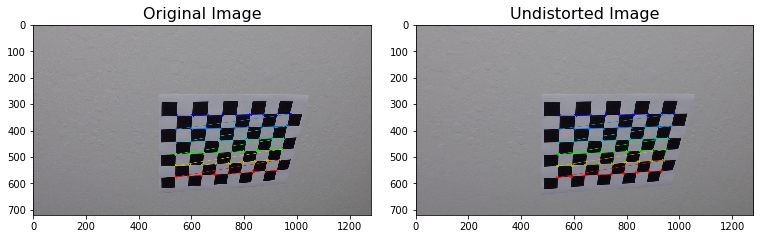

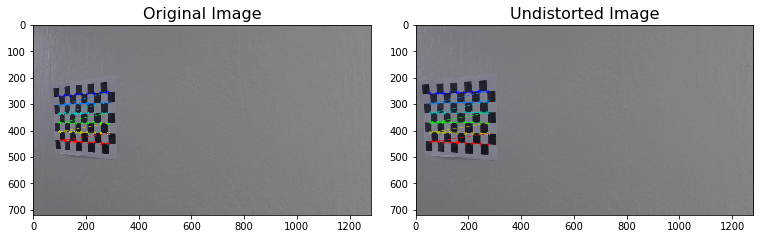

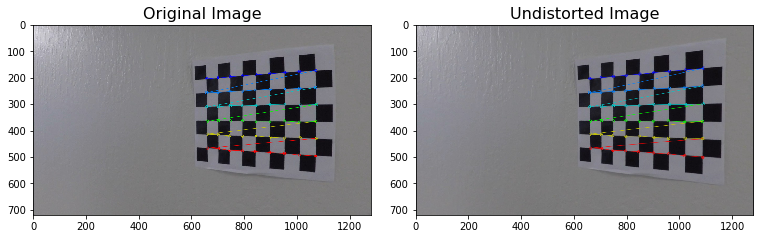

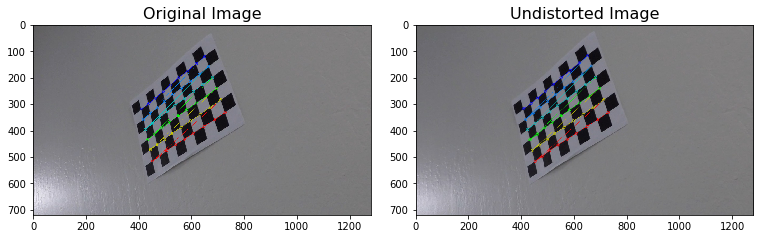

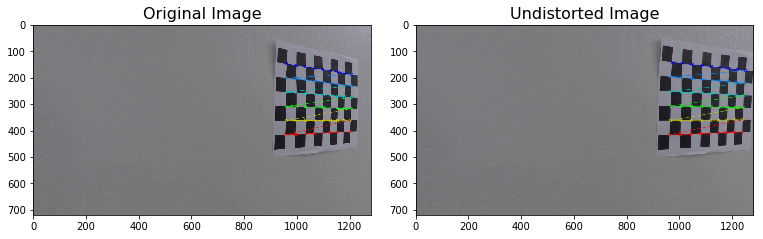

...

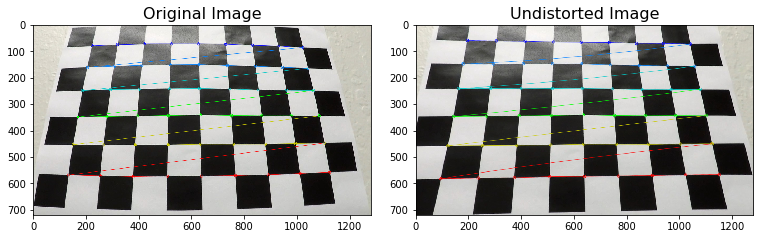

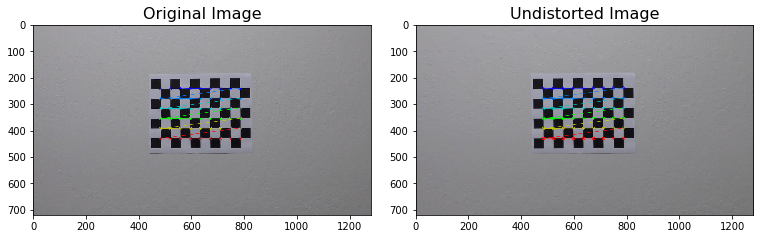

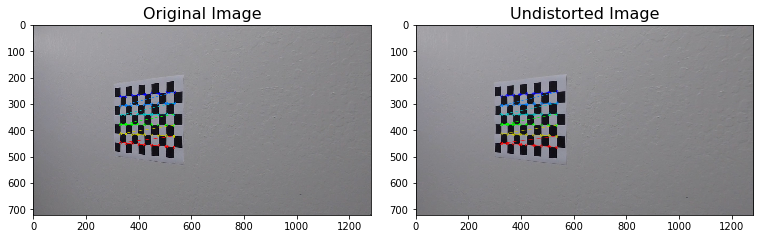

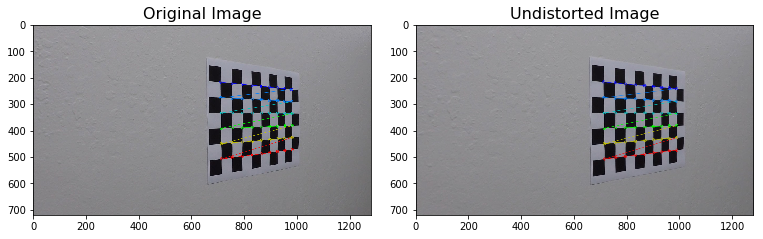

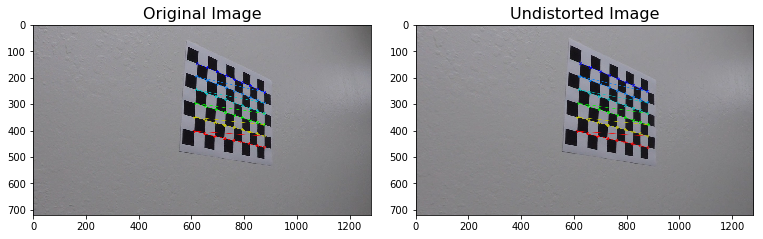

In [32]:
# Plot undistortion
i = 0
for img in imgDist:
    savePath = str('output_images/undistort' + str(i) + '.png')
    imgUnd = unDistortImage(caliMtx, caliDist, img)
    fig = plotCalibratedImages(img, imgUnd, savePath)
    i += 1

## Step 2: Undistort test images

In [33]:
# Make a list of calibration images
imgTestList = glob.glob('test_images/*.jpg')
imgTest = retrieveImage(imgTestList)

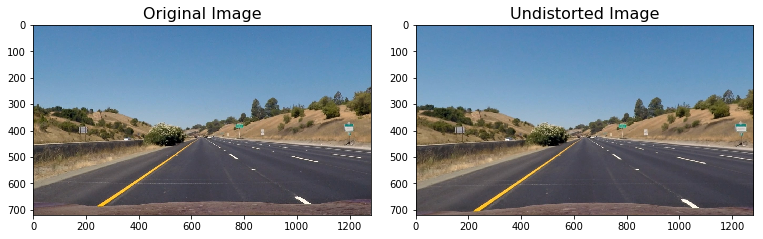

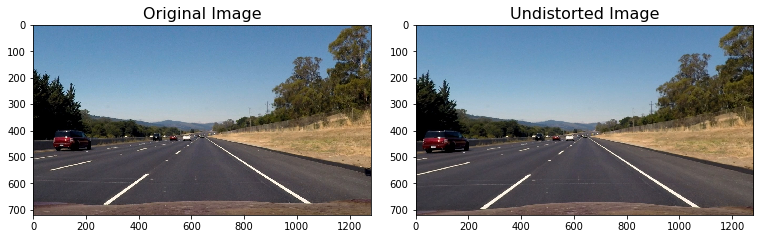

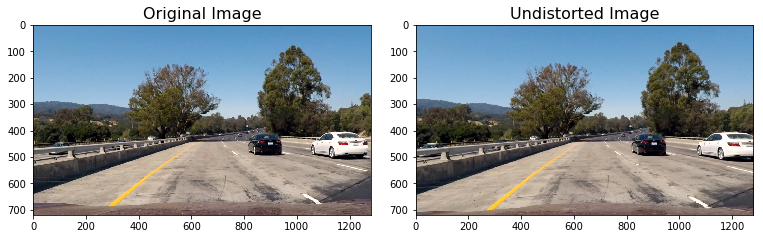

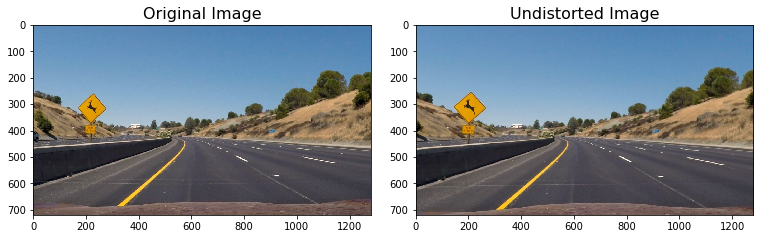

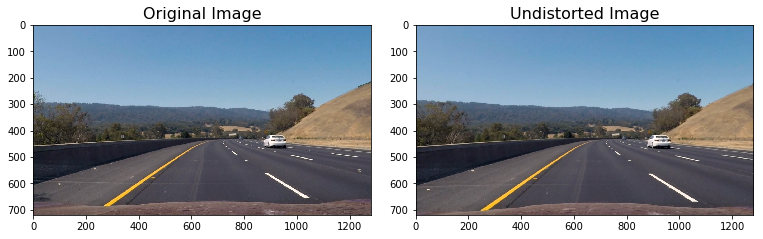

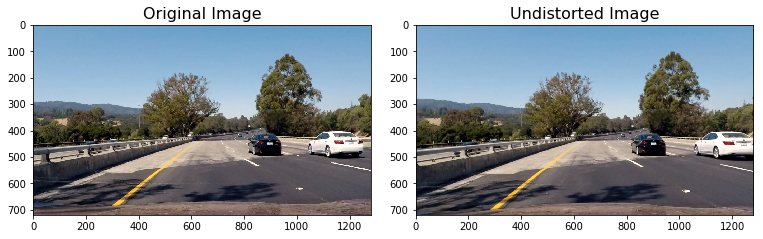

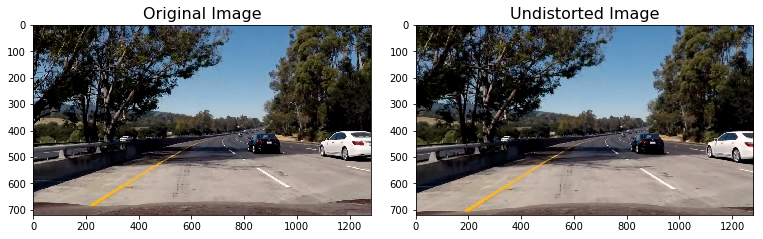

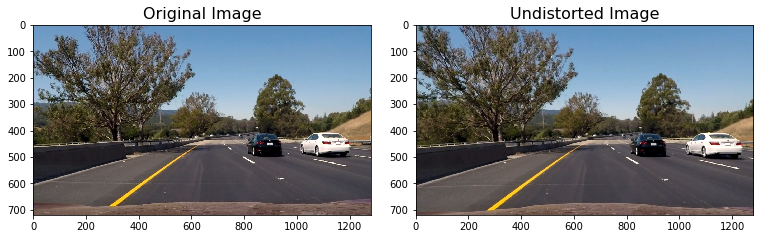

In [34]:
# Plot test image
imgTestUnd = []
i = 0
for img in imgTest:
    savePath = str('output_images/undistortTest' + str(i) + '.png')
    imgUnd = unDistortImage(caliMtx, caliDist, img)
    imgTestUnd.append(imgUnd)
    plotCalibratedImages(img, imgUnd, savePath)
    i += 1

## Step 3: Binary transformation

In [28]:
def binaryTransform(img, colorTh = (150, 255), SobelTh = (40, 100)):
    # Convert image into defined color space
    imgHLS = cv2.cvtColor(img, cv2.COLOR_RGB2HLS).astype(np.float)
    imgHSV = cv2.cvtColor(img, cv2.COLOR_RGB2HSV).astype(np.float)
    imgGray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY).astype(np.float)

    chR = img[:,:,0]
    chG = img[:,:,1]
    chL = imgHLS[:,:,1]
    chS = imgHLS[:,:,2]
    
    # Convolve image with Sobel filter on gray image
    imgSbX = cv2.Sobel(imgGray,cv2.CV_64F, 1, 0)
    imgSbXAbs = np.absolute(imgSbX)
    scaledSbX = np.uint8(255*imgSbXAbs/np.max(imgSbXAbs))
    
    # Threshold Sobel X gradient
    MaskSobelX = np.zeros_like(imgSbX)
    MaskSobelX[(scaledSbX >= SobelTh[0]) & (scaledSbX <= SobelTh[1])] = 1
    
    # Threshold Yellow channel (Detect yellow lane)
    MaskChY = np.zeros_like(imgGray)
    MaskChY[((chR >= 200) & (chR <= 255)) & ((chG >= 200) & (chG <= 255))] = 1

    # Threshold L channel (luminate, to improve shadow disturbance)
    MaskChL = np.zeros_like(chL)
    MaskChL[(chL > 150)] = 1

    # Threshold S channel (Detect bring white and yellow lane)
    MaskChS = np.zeros_like(chS)
    MaskChS[(chS >= 170) & (chS <= 255)] = 1

    # Stack gradient and color features
    imgStack = np.dstack((np.zeros_like(MaskSobelX), MaskSobelX, MaskChS))
    
    # Convert gradient features and color features into binary image
    imgBinary = np.zeros_like(MaskSobelX)
    imgBinary[ (MaskSobelX == 1) | (MaskChS == 1) | (MaskChY == 1) & (MaskChL == 1)] = 1

    return imgStack, imgBinary

def plotBinary(img, imgStack, imgBi, savePath):
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4))
    f.tight_layout()
    ax1.imshow(img)
    ax1.set_title('Original image', fontsize=16)

    ax2.imshow(imgStack)
    ax2.set_title('Color and gradient features', fontsize=16)

    ax3.imshow(imgBi, cmap = 'gray')
    ax3.set_title('Binary image', fontsize=16)

    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()
    f.savefig(savePath)
    return f

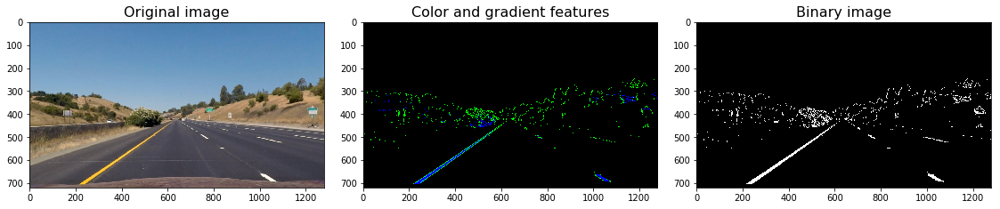

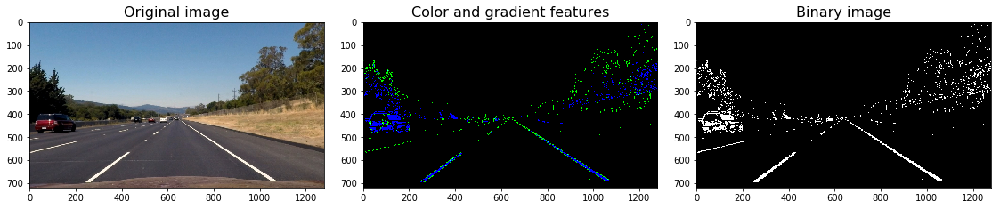

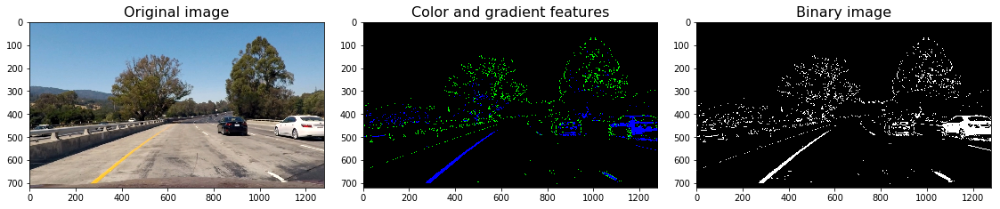

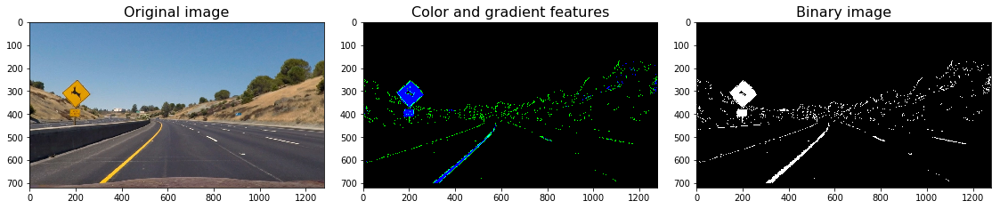

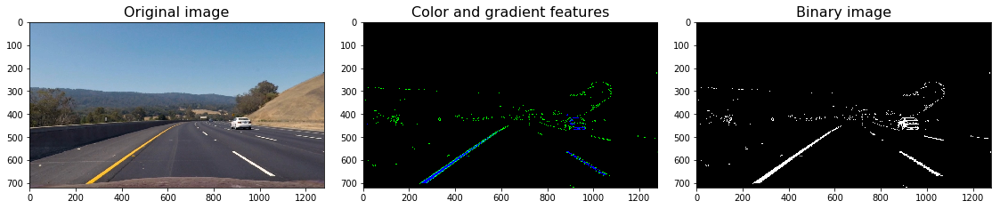

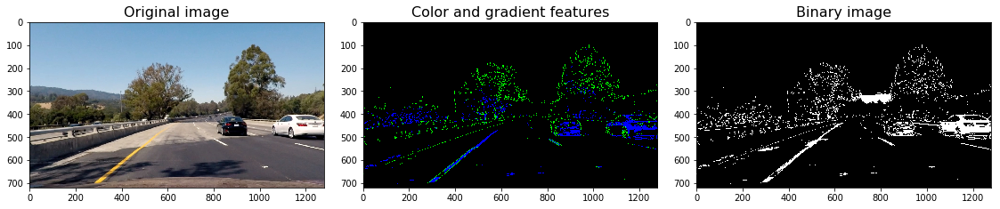

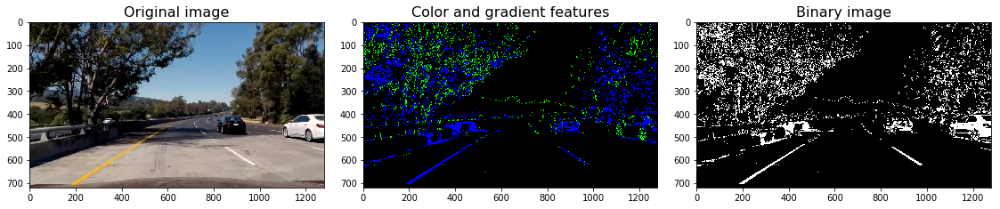

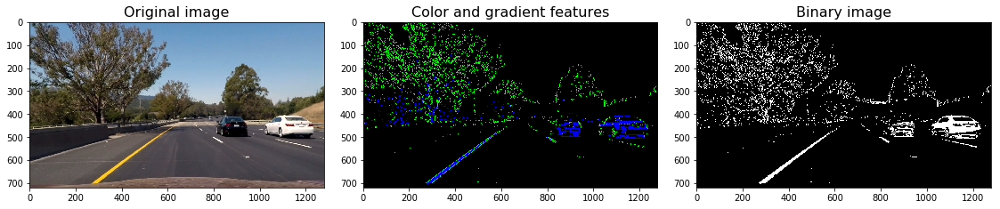

In [30]:
# Binary transformation
i = 0
for img in imgTestUnd:
    savePath = str('output_images/binaryTransform' + str(i) + '.png')
    imgStack, imgBi = binaryTransform(img)
    plotBinary(img,imgStack,imgBi,savePath)
    i +=1

## Step 4: Perspective transform 

In [35]:
def defBox():
    # Define source and destination points
    xOffL = 235
    xOffR = 285
    xOffDst = 160
    yOff = 160
    x4,y4 = [200,720]
    x3,y3 = [1180,720]
    x2,y2 = [x3 - xOffR,y3 - yOff]
    x1,y1 = [x4 + xOffL,y4 - yOff]
    # define 4 source points for a rectangle, order is clockwise from top left
    src = np.array([[x1,y1],[x2,y2],[x3,y3],[x4,y4]],np.float32)
    src = src.reshape((-1,1,2))
    # define 4 destination points corresponds to src, order must be same as scr
    dst = np.array([[x1-xOffDst,y1],[x2+xOffDst,y2],[x2+xOffDst,y3],[x1-xOffDst,y4]],np.float32)
    dst = dst.reshape((-1,1,2))
    return src, dst

def PerspectTransform(img, src, dst):
    # use cv2.getPerspectiveTransform() to get M, the transform matrix
    M = cv2.getPerspectiveTransform(src, dst)
    # Output image size
    imgX, imgY = img.shape[1], img.shape[0]
    # use cv2.warpPerspective() to warp your image to a top-down view
    imgPer = cv2.warpPerspective(img, M, (imgX, imgY), flags = cv2.INTER_LINEAR)
    return imgPer, M

def plotPerspect(img, imgPer, imgPerBi, src, dst, savePath):
    imgCopy = np.copy(img)
    src = src.astype(np.int32)
    cv2.polylines(imgCopy,[src],True,(0,0,255),10)

    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4))
    f.tight_layout()
    ax1.imshow(imgCopy)
    ax1.set_title('Original image', fontsize=16)
    ax2.imshow(imgPer)
    ax2.set_title('Top view of image', fontsize=16)
    ax3.imshow(imgPerBi,cmap = 'gray')
    ax3.set_title('Top view of image, binary', fontsize=16)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()
    f.savefig(savePath)
    return f

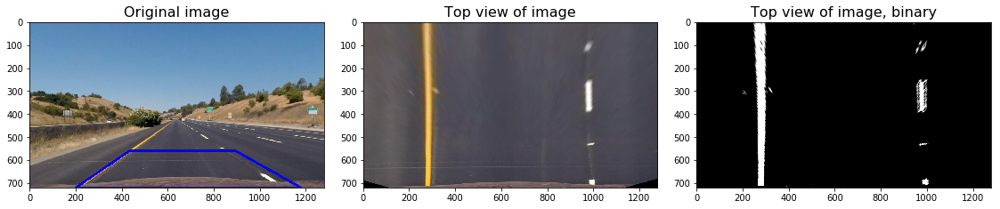

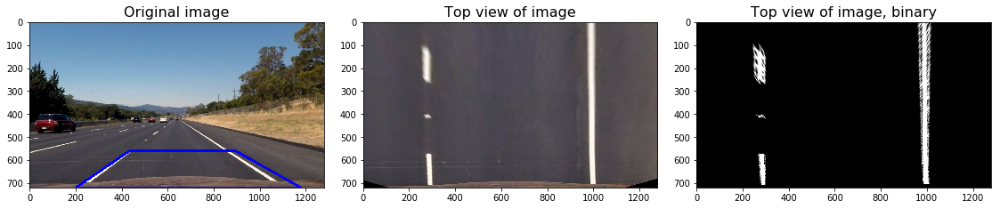

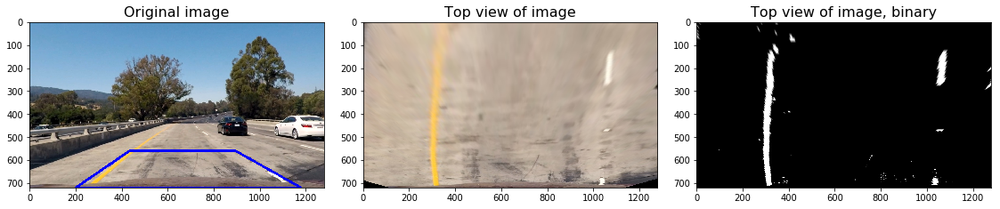

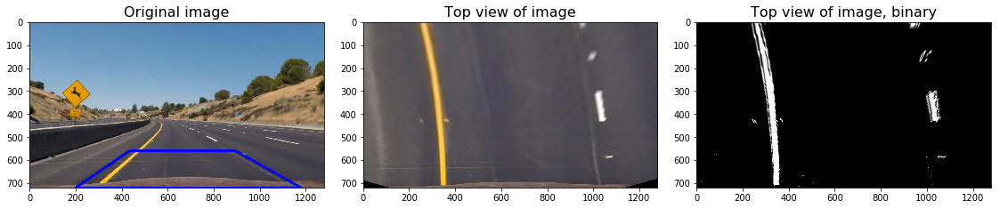

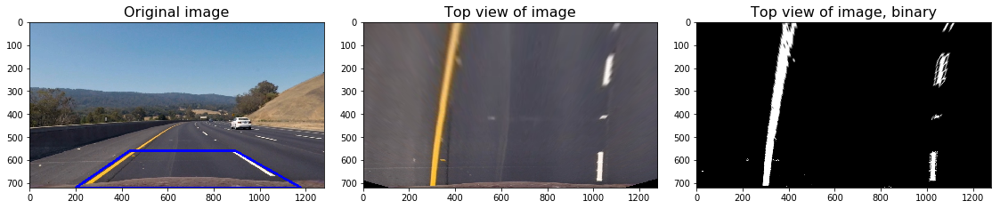

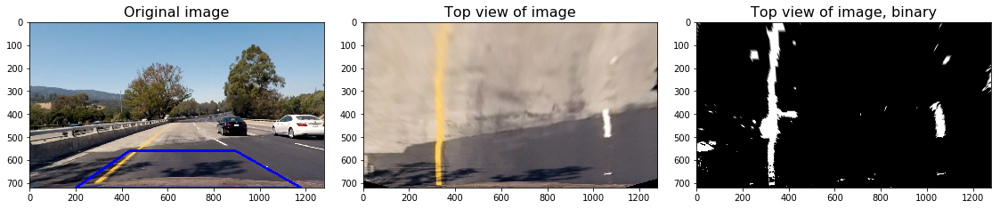

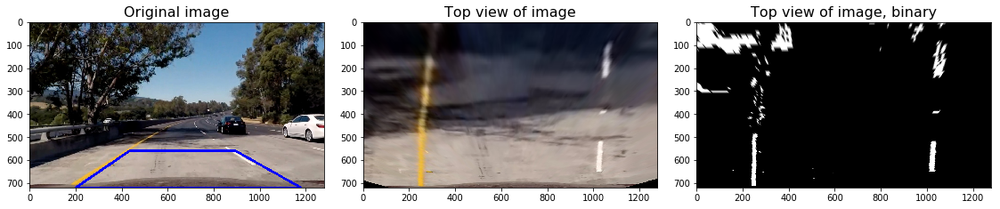

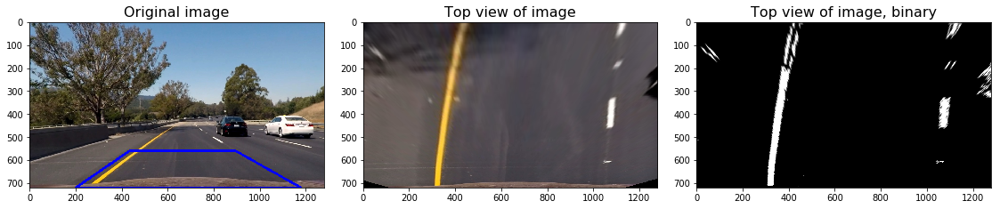

In [36]:
# Plot perspective transformation
src, dst = defBox()
i = 0
for img in imgTestUnd:
    savePath = str('output_images/perspectTransform' + str(i) + '.png')
    imgStack, imgBi = binaryTransform(img)
    imgPer,MatPer = PerspectTransform(img, src, dst)
    imgPerBi,MatPer = PerspectTransform(imgBi, src, dst)
    plotPerspect(img, imgPer, imgPerBi, src, dst, savePath)
    i += 1

## Step 5: Lane detection

In [41]:
def findWinCentHist(img, window_width, window_height, margin):
    # Choose the number of sliding windows
    nVet = np.int(img.shape[0]/window_height)
    # Take a histogram of the bottom half of the image
    histogram = np.sum(img[img.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and  visualize the result
    imgOut = np.array(cv2.merge((255*img,255*img,255*img)),np.uint8) 
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]/2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set minimum number of pixels found to recenter window
    minpix = 50
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nVet):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = img.shape[0] - (window + 1)*window_height
        win_y_high = img.shape[0] - (window)*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        # Draw the windows on the visualization image
        cv2.rectangle(imgOut,(win_xleft_low,win_y_low),(win_xleft_high,win_y_high),(0,255,0), 10) 
        cv2.rectangle(imgOut,(win_xright_low,win_y_low),(win_xright_high,win_y_high),(0,255,0), 10)
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) 
                          & (nonzerox >= win_xleft_low) & (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) 
                           & (nonzerox >= win_xright_low) & (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    # Extract left and right line pixel positions
    xL = nonzerox[left_lane_inds]
    yL = nonzeroy[left_lane_inds] 
    xR = nonzerox[right_lane_inds]
    yR = nonzeroy[right_lane_inds]
    return xL,yL,xR,yR, imgOut

def fitLaneline(xL,yL,xR,yR):
    # Compute coefficient of second order polynomial
    coefL = np.polyfit(yL, xL, 2)
    coefR = np.polyfit(yR, xR, 2)
    return coefL, coefR

def drawRegion(imgUnd, imgPer, coefL, coefR, matPerInv):
    imgOut = np.copy(imgUnd)
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(imgPer).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    # Recast the x and y points into usable format for cv2.fillPoly()
    yFit = np.linspace(0, img.shape[0]-1, img.shape[0] )
    xLFit = coefL[0]*yFit**2 + coefL[1]*yFit + coefL[2]
    xRFit = coefR[0]*yFit**2 + coefR[1]*yFit + coefR[2]
    ptsL = np.array([np.transpose(np.vstack([xLFit, yFit]))])
    ptsR = np.array([np.flipud(np.transpose(np.vstack([xRFit, yFit])))])
    pts = np.hstack((ptsL, ptsR))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, matPerInv, (imgOut.shape[1], imgOut.shape[0])) 
    # Combine the result with the original image
    imgOut = cv2.addWeighted(imgOut, 1, newwarp, 0.3, 0)
    return imgOut

def calRadius(xL,yL,xR,yR,coefLPix, coefRPix):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 30/720 # meters per pixel in y dimension
    xm_per_pix = 3.7/700 # meters per pixel in x dimension
    # Fit new polynomials to x,y in world space
    coefL = np.polyfit(yL*ym_per_pix, xL*xm_per_pix, 2)
    coefR = np.polyfit(yR*ym_per_pix, xR*xm_per_pix, 2)
    # Calculate the new radii of curvature
    y_eval = np.max(yL)
    # Radius of curvature is in meters
    radL = ((1 + (2*coefL[0]*y_eval*ym_per_pix + coefL[1])**2)**1.5) / np.absolute(2*coefL[0])
    radR = ((1 + (2*coefR[0]*y_eval*ym_per_pix + coefR[1])**2)**1.5) / np.absolute(2*coefR[0])
    rad = (radL + radR)/2
    # Calculate center deviation of vehicle
    yFit = 720
    xLFit = coefLPix[0]*yFit**2 + coefLPix[1]*yFit + coefLPix[2]
    xRFit = coefRPix[0]*yFit**2 + coefRPix[1]*yFit + coefRPix[2]
    LaneCent = (xLFit + xRFit) / 2
    xCar = 1280/2
    dx = (xCar - LaneCent)*xm_per_pix
    # Print out text of radius
    s1 = str('Radius of curvature = ' + str(round(rad,1)) + ' m')
    if dx < 0:
        s2 = str('Vehicle is ' + str(round(-dx,2)) + ' m left of center')
    elif dx > 0:
        s2 = str('Vehicle is ' + str(round(dx,1)) + ' m right of center')
    else:
        s2 = str('Vehicle is at the center')
    return rad, s1, s2

def plotLaneline(img, imgLine, imgRegion, xL,yL,xR,yR, coefL, coefR, pSrc):
    # Draw region for perspective
    imgCopy = np.copy(img)
    pSrc = pSrc.astype(np.int32)
    cv2.polylines(imgCopy,[pSrc],True,(0,0,255),10)
    # Reverse coordinates as y coord in plt is top to bottom
    yFit = np.linspace(0, img.shape[0]-1, img.shape[0] )    
    xLFit = coefL[0]*yFit**2 + coefL[1]*yFit + coefL[2]
    xRFit = coefR[0]*yFit**2 + coefR[1]*yFit + coefR[2]
    imgLine[yL, xL] = [255, 0, 0]
    imgLine[yR, xR] = [0, 0, 255]
    # Plot
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 4))
    f.tight_layout()
    ax1.imshow(imgCopy)
    ax1.set_title('Top view of road (binary)', fontsize=16)
    ax2.imshow(imgLine)
    ax2.plot(xLFit, yFit, color='yellow')
    ax2.plot(xRFit, yFit, color='yellow')
    ax2.set_title('Road with detected laneline', fontsize=16)
    ax3.imshow(imgRegion)
    ax3.set_title('Detected lanline in normal view', fontsize=16)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()
    f.savefig(savePath)
    return f

In [42]:
def processImg(imgIn,savePath):
    # Step 1, undistort
    imgUnd = unDistortImage(caliMtx, caliDist, imgIn)
    # Step 2, binary transformation
    imgStack, img = binaryTransform(imgUnd)
    # Step 3, perspective transformation
    img, MatPer = PerspectTransform(img, src, dst)
    # Step 4, sliding window search
    xL,yL,xR,yR, imgLine = findWinCentHist(img, window_width, window_height, margin)
    # Step 5, laneline fit
    coefL,coefR = fitLaneline(xL,yL,xR,yR)
    # Step6, draw lane region
    MatPerInv = np.linalg.pinv(MatPer)
    imgOut = drawRegion(imgUnd, img, coefL, coefR, MatPerInv)
    # Step 7, calculate radius
    rad, s1, s2 = calRadius(xL,yL,xR,yR, coefL, coefR)
    cv2.putText(imgOut,s1, (100,80), font, 2,(255,255,255),3)
    cv2.putText(imgOut,s2, (100,150), font, 2,(255,255,255),3)
    # Step 8, plot image
    fig = plotLaneline(imgIn, imgLine, imgOut, xL,yL,xR,yR, coefL, coefR, src)
#     fig.savefig(savePath)

In [43]:
# Define parameters
window_width = 50
# Break image into 9 vertical layers since image height is 720
window_height = 90
# How much to slide left and right for searching
margin = 100
src, dst = defBox()
font = cv2.FONT_HERSHEY_SIMPLEX

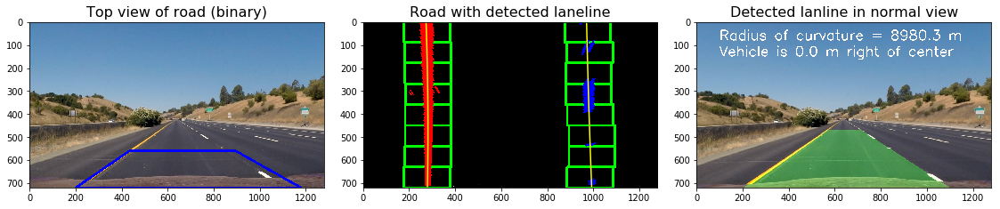

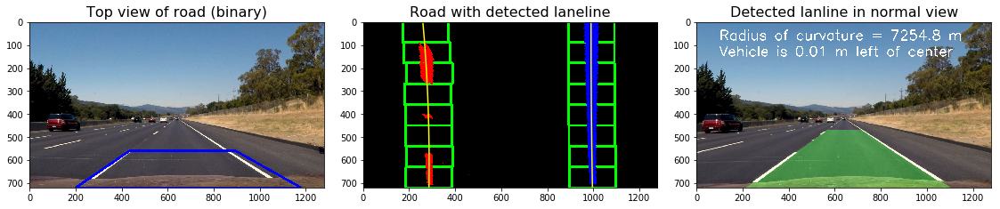

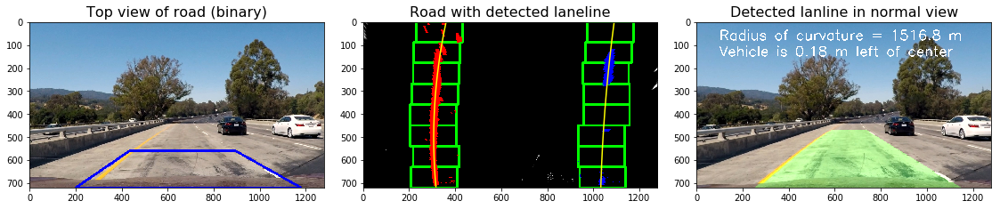

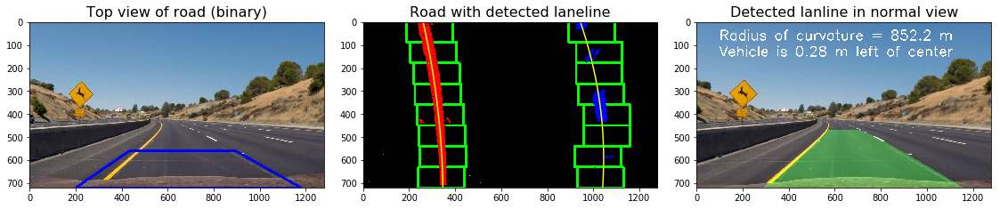

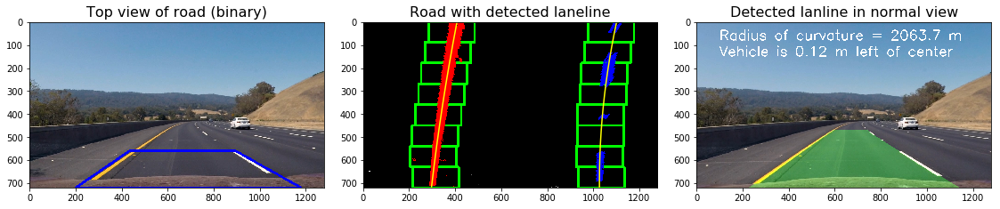

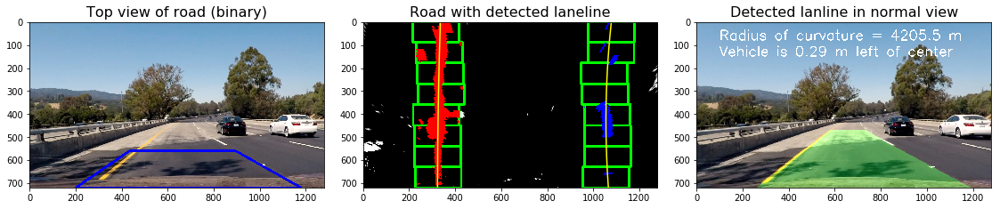

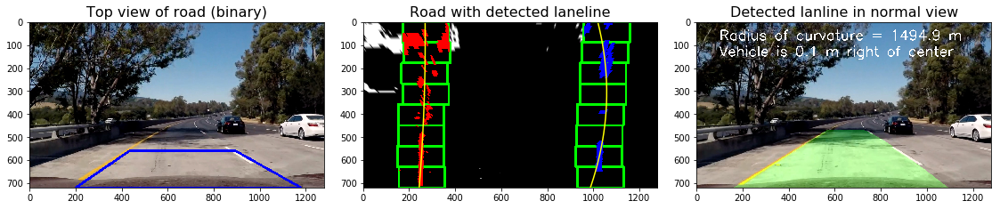

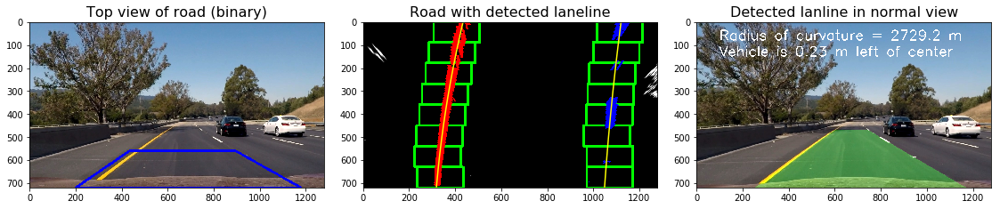

In [44]:
# Display the final results
i = 0
for imgIn in imgTest:
    savePath = str('output_images/lanelineDetection' + str(i) + '.png')
    processImg(imgIn,savePath)
    i+=1

## Step 6: Process video

In [64]:
# Define overall pipeline
global coefLArray, coefRArray, counter
counter = 0
coefLArray = []
coefRArray = []
def processVideo(imgIn):
    # Step 1, undistort image
    imgUnd = unDistortImage(caliMtx, caliDist, imgIn)
    
    # Step 2, binary transformation
    imgStack, img = binaryTransform(imgUnd)
    
    # Step 3, perspective transformation
    img,MatPer = PerspectTransform(img, src, dst)
    
    # Step 4, sliding window search
    xL,yL,xR,yR, imgLine = findWinCentHist(img, window_width, window_height, margin)
    
    # Step 5, laneline fit
    global coefLArray, coefRArray, counter
    coefL,coefR = fitLaneline(xL,yL,xR,yR)
    
    # Step 6, smooth fitted laneline coefficient 
    if counter < 10:
        coefLArray.append(coefL)
        coefRArray.append(coefR)
        counter += 1
    else:
        coefLArray = coefLArray[1:]
        coefRArray = coefRArray[1:]
        coefLArray.append(coefL)
        coefRArray.append(coefR)
    coefLAvg = np.mean(np.array(coefLArray), axis=0)
    coefRAvg = np.mean(np.array(coefRArray), axis=0)

    # Step 7, draw lane region
    MatPerInv = np.linalg.pinv(MatPer)
    imgOut = drawRegion(imgUnd, img, coefLAvg, coefRAvg, MatPerInv)
    
    # Step 8, calculate radius and vehicle position
    rad, s1, s2 = calRadius(xL,yL,xR,yR, coefLAvg, coefRAvg)
    cv2.putText(imgOut,s1, (100,80), font, 2,(255,255,255),3)
    cv2.putText(imgOut,s2, (100,150), font, 2,(255,255,255),3)    
    return imgOut

In [65]:
# Test pipeline
for img in imgTest:
    imgOut = processVideo(img)
# img = imgTest[4]
# imgOut = processVideo(img)

In [66]:
# Process video1 clip1
videoLv1Out = 'output_videos/video1_out.mp4'
videoLv1 = VideoFileClip('test_videos/videoLv1.mp4')

videoLv1Obj = videoLv1.fl_image(processVideo)
%time videoLv1Obj.write_videofile(videoLv1Out, audio=False)

[MoviePy] >>>> Building video output_videos/video1_out.mp4
[MoviePy] Writing video output_videos/video1_out.mp4


100%|█████████▉| 1260/1261 [05:54<00:00,  3.60it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: output_videos/video1_out.mp4 

CPU times: user 5min 24s, sys: 1min 53s, total: 7min 17s
Wall time: 5min 55s


In [67]:
# Process video1 clip2
videoLv2Out = 'output_videos/video2_out.mp4'
videoLv2 = VideoFileClip('test_videos/videoLv2.mp4')

videoLv2Obj = videoLv2.fl_image(processVideo)
%time videoLv2Obj.write_videofile(videoLv2Out, audio=False)

[MoviePy] >>>> Building video output_videos/video2_out.mp4
[MoviePy] Writing video output_videos/video2_out.mp4


 27%|██▋       | 133/485 [00:31<01:21,  4.33it/s]

TypeError: expected non-empty vector for x

In [ ]:
# Process video1 clip3
videoLv3Out = 'output_videos/video3_out.mp4'
videoLv3 = VideoFileClip('test_videos/videoLv3.mp4')

videoLv3Obj = videoLv3.fl_image(processVideo)
%time videoLv3Obj.write_videofile(videoLv3Out, audio=False)